#### Import required Python libraries

In [3]:
pip install scikit-learn==1.1.3

Defaulting to user installation because normal site-packages is not writeable
distutils: /home/siu856525636/.local/lib/python3.9/site-packages
sysconfig: /home/siu856525636/.local/lib64/python3.9/site-packages
user = True
home = None
root = None
prefix = None
Note: you may need to restart the kernel to use updated packages.


In [46]:
import numpy as np
import pandas as pd
import sklearn
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

In [47]:
import warnings
warnings.filterwarnings('ignore')

In [48]:
# Load the data set
from sklearn.datasets import load_boston

In [49]:
boston_data = load_boston()

In [50]:
boston_data['data'].shape

(506, 13)

And there is description about the data

In [51]:
print(boston_data['DESCR'])

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

We will create Pandas DataFrame with data from Boson dataset

In [52]:
df = pd.DataFrame(data=boston_data['data'])

df.columns = boston_data['feature_names']


We' ll add target data to this DataFrame

In [53]:
df['Price'] =  boston_data['target']

In [54]:
df.head()

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,Price
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


We'll first try Simple Linear Regression with single independent variable

If we check the correlation of all other features with Target, 


In [55]:
corr =  df.corr()          #write code

In [56]:
corr['Price'].sort_values(ascending=False)

Price      1.000000
RM         0.695360
ZN         0.360445
B          0.333461
DIS        0.249929
CHAS       0.175260
AGE       -0.376955
RAD       -0.381626
CRIM      -0.388305
NOX       -0.427321
TAX       -0.468536
INDUS     -0.483725
PTRATIO   -0.507787
LSTAT     -0.737663
Name: Price, dtype: float64

From description RM is number of rooms per dwelling. 
This feature is more correlated with housing price. 

We can also qualitatively see the correlation map 

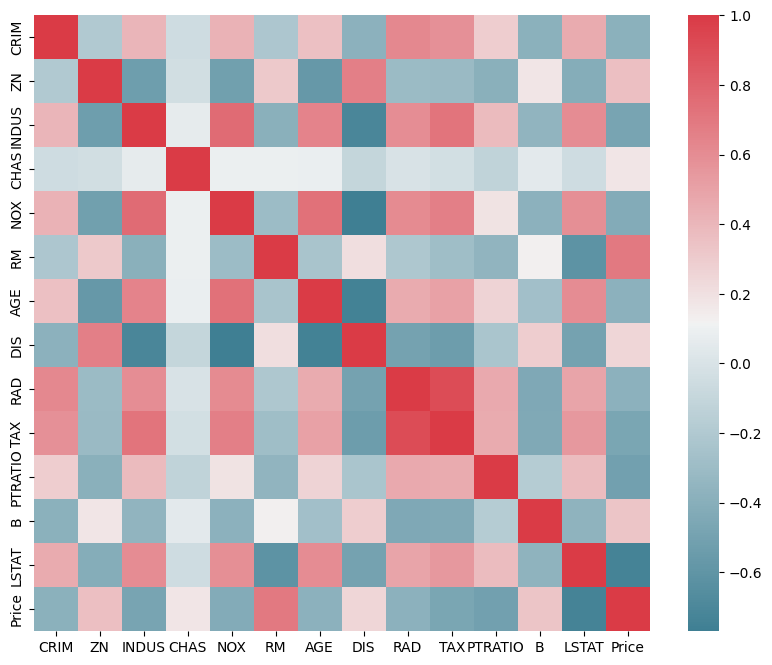

In [57]:
import seaborn as sns

f, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(corr, mask=np.zeros_like(corr, dtype=np.bool_), cmap=sns.diverging_palette(220, 10, as_cmap=True),
            square=True, ax=ax)
plt.show()

The bottom most row show the correlation  the square 

From the last column we can see only the RM feature has good linear relation with housing price <br>
So, for this Simple Linear Regression we'll just consider RM and Price features

In [58]:
#write code
x = df['RM']
y = df['Price']

In [59]:
from pylab import rcParams
rcParams['figure.figsize'] = 4, 4

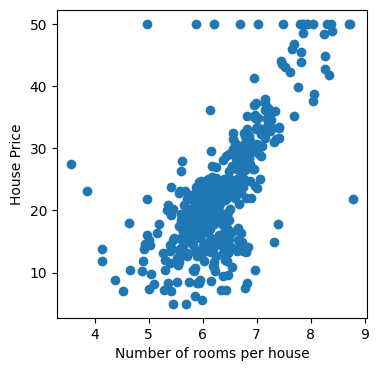

In [60]:
#write code to draw a scatter plot

plt.scatter(x,y)
plt.xlabel('Number of rooms per house', size = 10)
plt.ylabel('House Price', size = 10)
plt.show()

We need to do feature scaling for linear gradient, for better convergence

In [61]:
x = (x - x.mean())/x.std()
y = (y - y.mean())/y.std()

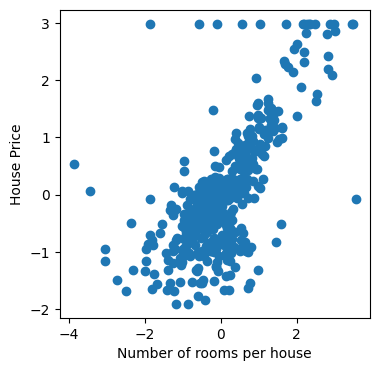

In [62]:
#write code to draw a scatter plot

plt.scatter(x,y)
plt.xlabel('Number of rooms per house', size = 10)
plt.ylabel('House Price', size = 10)
plt.show()

# Simple Linear Regression

This is called simple linear regression model since it involves only one regressor variable (RM) <br>
And we want to model the data using a linear plot 

\begin{equation}
y = \theta_0 + \theta_1 x 
\end{equation}


Here x is the independent variable (or predictor or regressor)  'RM' and y is the dependent variable(or response) 'House Price' 

We use Stochastic Gradient Descent (or Batch Gradient Descent) to find these coefficients 

## Gradient Descent 

This is an optimization technique to find the minimum or maximum of a function by iterating through a sequence of steps. <br>
Gradient Descent algorithms also called steepest descent algorithms

![Image of Cost_function](https://drive.google.com/uc?id=1RWNEHqYioPrE49_og695T3cAgS3jGj02)


As per this technique we first estimate some values for $\theta_0$ and $\theta_1$ 

We'll first start with initial guess for $\theta_0$ and $\theta_1$ and update the values Gradient descent algorithm

$$(\theta_0, \theta_1)' = (\theta_0, \theta_1) - \alpha \nabla J(\theta_0, \theta_1)$$

$\alpha$ is the learning rate. We keep this constant through out the algorithm. <br>
$\nabla J$ is the gradient of the cost function J. <br>
The distance we move depends on this gradient. 
i.e. distance we move is proportional to the steepness of the function at that
position. <br>
So we take big steps when the function is steep and small steps when 
it is shallow. 

In this post we'll try to solve Gradient Descent from the scratch and compare that with the sci-kit learn Gradient Descent model

### From the scratch

So as per this [equation](#add_ones) we need to consider $x_0$ as ones <br>
i.e. we need to add a column of ones to x

In [63]:
x = np.c_[np.ones(x.shape[0]),x]

In [64]:
# Parameters required for Gradient Descent
alpha = 0.0001   #learning rate
m = y.size  #no. of samples
np.random.seed(10)  
theta = np.random.rand(2)  #initializing theta with some random values

In [65]:
def gradient_descent(x, y, m, theta,  alpha):
    cost_list = []   #to record all cost values to this list
    theta_list = []  #to record all theta_0 and theta_1 values to this list 
    prediction_list = []
    run = True
    cost_list.append(1e10)    #we append some large value to the cost list
    i=0
    while run:
        #write code
        prediction = np.dot(x, theta)
        prediction_list.append(prediction)
        error = prediction - y
        cost = 1/(2*m) * np.dot(error, error)
        cost_list.append(cost)
        theta = theta - (alpha * (1/m) * np.dot(x.T , error))
        theta_list.append(theta)
        
        
        
        if cost_list[i]-cost_list[i+1] < 1e-9:   #checking if the change in cost function is less than 10^(-9)
            run = False
        
        i+=1
    cost_list.pop(0)   # Remove the large number we added in the begining 
    return prediction_list, cost_list, theta_list
        

In [66]:
prediction_list, cost_list, theta_list =  gradient_descent(x, y, y.size, np.random.rand(2), alpha)                #write code

In [67]:
theta = theta_list[-1]

In [68]:
print("Values of theta are {:2f} and {:2f}".format(theta[0], theta[1]))

Values of theta are 0.003150 and 0.695628


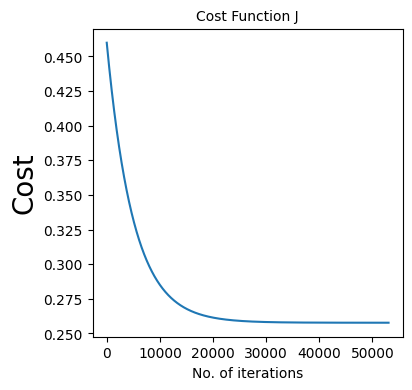

In [69]:
#write code to draw a plot on No. of iterations vs Cost

plt.title('Cost Function J', size = 10)
plt.xlabel('No. of iterations', size=10)
plt.ylabel('Cost', size=20)
plt.plot(cost_list)
plt.show()


# Animating Cost Function

Now we'll try to see the cost function animation <br>
i.e. how cost function value eventually change with the number of iterations and respectively how the linear 
regression line change 

Just ignore the below code, it is too much hard coded for making the animation. 

In [70]:
xl = np.linspace(0, len(cost_list),len(cost_list))
cost_list_mod = cost_list[::-1][0::100][::-1]
x_mod = xl[::-1][0::100][::-1]
prediction_list_mod = prediction_list[::-1][0::100][::-1]

In [71]:
fig = plt.figure(figsize=(12,10))
ax1=plt.subplot(121)
ax1.scatter(x[:,1], y, color='C1')
ax1.set_xlabel('Average number of rooms per dwelling')
ax1.set_ylabel('House Price')



ax2=plt.subplot(122)
ax2.set_xlim(-2,140000)
ax2.set_ylim((0, 1))
ax2.set_xlabel('Number of iterations')
ax2.set_ylabel('Cost Function')
line1, = ax1.plot([], [], lw=2);
line2, = ax2.plot([], [], lw=2);
line3, = ax2.plot([], [], 'o');


annotation1 = ax1.text(-3.5, 3, '', size=18)
annotation2 = ax2.text(16500, .957, '', size=18)
annotation1.set_animated(True)
annotation2.set_animated(True)
plt.close()

In [72]:
def init():
    line1.set_data([], [])
    line2.set_data([], [])
    return (line1, line2,)

# animation function. 
def animate(i):
    line1.set_data(x[:,1], prediction_list_mod[i])
    line2.set_data(x_mod[:i],cost_list_mod[:i])
    line3.set_data(x_mod[i],cost_list_mod[i])
    
    annotation1.set_text('J = %.2f' % (cost_list_mod[i]))
    annotation2.set_text('J = %.2f' % (cost_list_mod[i]))
    return line1, line2, line3, annotation1, annotation2

anim = animation.FuncAnimation(fig, animate, init_func=init,
                               frames=500,interval=15,  blit=True)

anim.save('animation.gif', writer='imagemagick', fps = 30)

# HTML(anim.to_html5_video())

MovieWriter imagemagick unavailable; using Pillow instead.



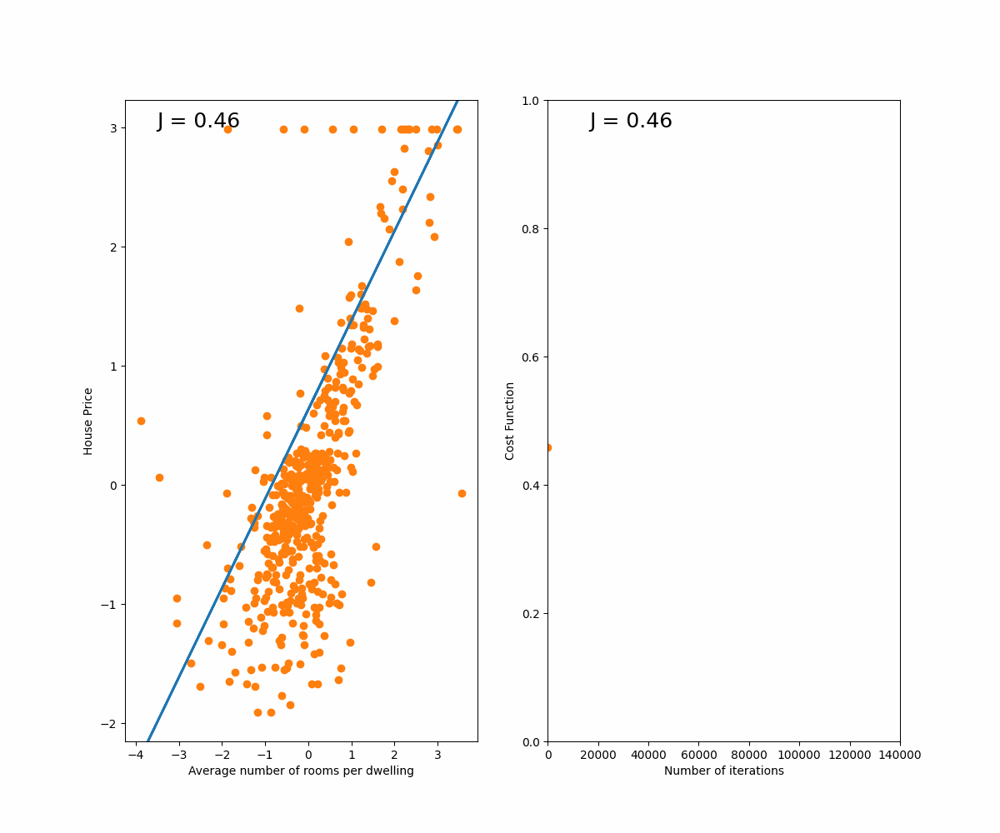

In [73]:
#Display the animation...
import io
import base64
from IPython.display import HTML

filename = 'animation.gif'

video = io.open(filename, 'r+b').read()
encoded = base64.b64encode(video)
HTML(data='''<img src="data:image/gif;base64,{0}" type="gif" />'''.format(encoded.decode('ascii')))

In [74]:
import matplotlib.animation as animation
print(animation.writers.list())

['pillow', 'html']


Ok, from the above animation we notice that with the number of iterations increasing the cost function value is 
decreasing and the linear regression line is fitting properly to the data. 

Since, for this $\alpha$ (learning rate) this case is converging, so this is happening. <br>
For other $\alpha$ like increasing, this won't be happening. <br>
We'll try to plot the cost function for different $\alpha$ and see how alpha affects the convergence 

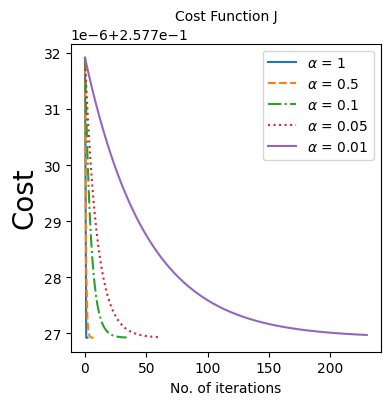

In [75]:
alpha_list = [1,0.5,0.1,0.05,0.01] 
plot_style = ["-","--","-.",":"]
from itertools import cycle
plot_styles = cycle(plot_style)
for i in range(len(alpha_list)):
    prediction_list, cost_list, theta_list = gradient_descent(x, y, m, theta, alpha_list[i])               #write code
    plt.title('Cost Function J', size = 10)
    plt.xlabel('No. of iterations', size=10)
    plt.ylabel('Cost', size=20)
    plt.plot(cost_list,next(plot_styles), label =r'$\alpha$ = {}'.format(alpha_list[i]) )
    plt.legend()
plt.show()


We can see with the increase in $\alpha$ the curve steep rate is increasing, so the convergence rate will be 
higher

Residuals are very useful in finding the fidelity of the model 


Mean square of the residuals can be find by 

Mean square of residuals = $(1/m) \times (Predicted \quad Response - Response)^2 $

Predicted value we can either find from $y_{predicted} = \theta_0 + \theta_1 \times x$